# Overview

This notebook is intended to demo the capabilities of Amazon Rekognition AI Service for Images and Videos with facial analysis and facial search

Aaron Sengstacken - awsaaron@amazon.com


In [2]:
# import libraries
import boto3
import numpy
import cv2
import matplotlib.pyplot as plt
import random
import matplotlib.image as mpimg

# Data
Let's grab some data from our s3 bucket

In [3]:
!aws s3 cp 's3://random.datasets.sengstacken/faces_people/' './data/' --recursive --exclude "*/*"
!aws s3 cp 's3://random.datasets.sengstacken/faces_people/paolo/London_Runners_01.m4v' './data/'

download: s3://random.datasets.sengstacken/faces_people/FaceMask2.jpg to data/FaceMask2.jpg
download: s3://random.datasets.sengstacken/faces_people/FaceMasks1.jpg to data/FaceMasks1.jpg
download: s3://random.datasets.sengstacken/faces_people/chiefs_probowl.jpg to data/chiefs_probowl.jpg
download: s3://random.datasets.sengstacken/faces_people/chiefs2.jpeg to data/chiefs2.jpeg
download: s3://random.datasets.sengstacken/faces_people/chiefs1.png to data/chiefs1.png
download: s3://random.datasets.sengstacken/faces_people/FP20-08953-0412_PR.jpg to data/FP20-08953-0412_PR.jpg
download: s3://random.datasets.sengstacken/faces_people/kelce1.jpg to data/kelce1.jpg
download: s3://random.datasets.sengstacken/faces_people/FP20-08953-0203_PR.jpg to data/FP20-08953-0203_PR.jpg
download: s3://random.datasets.sengstacken/faces_people/FP20-08953-0301_PR.jpg to data/FP20-08953-0301_PR.jpg
download: s3://random.datasets.sengstacken/faces_people/mahomes2.jpg to data/mahomes2.jpg
download: s3://random.datase

Next, let's display one of the images using matplotlib

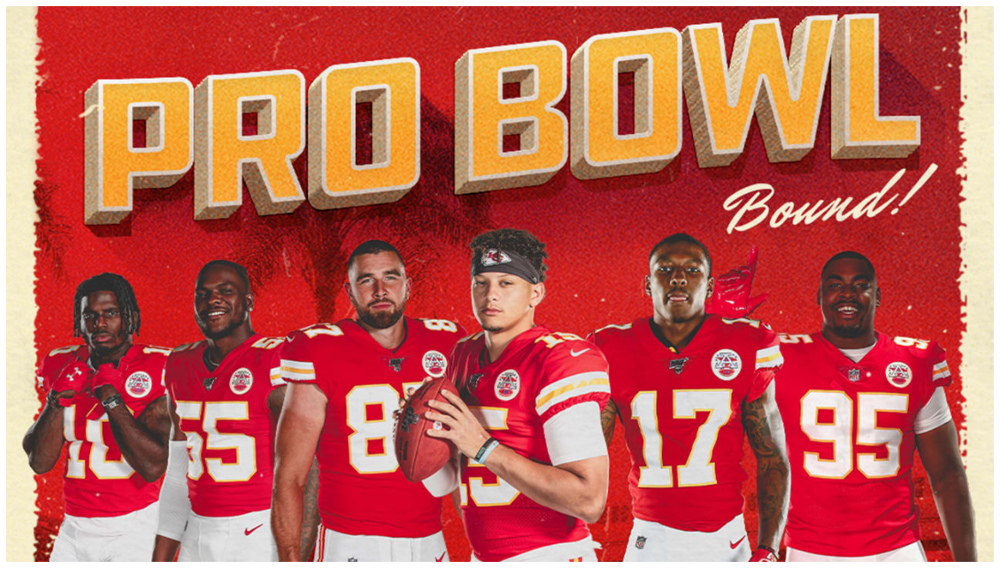

In [5]:
img_file = './data/chiefs_probowl.jpg'
img=mpimg.imread(img_file)
plt.figure(figsize=(20,20))
plt.axis('off')
plt.imshow(img)

# Static Images


## Find Faces in an Image

DetectFaces detects the 100 largest faces in the image. For each face detected, the operation returns face details. These details include a bounding box of the face, a confidence value (that the bounding box contains a face), and a fixed set of attributes such as facial landmarks (for example, coordinates of eye and mouth), presence of beard, sunglasses, and so on.

Let's use the same image from above to detect the faces

In [6]:
client=boto3.client('rekognition')
bucket = 'random.datasets.sengstacken'
name = 'faces_people/chiefs_probowl.jpg'#'faces_people/grocery_store.mp4'
job_response = client.detect_faces(
    Image={
        'S3Object': {
            'Bucket': bucket,
            'Name': name,
        }
    },
    Attributes=[
        'ALL',
    ]
)

In [7]:
print('Total Number of Faces Detected - '+str(len(job_response['FaceDetails'])))

Total Number of Faces Detected - 6


In [8]:
job_response['FaceDetails'][0]

{'BoundingBox': {'Width': 0.05706911161541939,
  'Height': 0.1365361511707306,
  'Left': 0.6527225375175476,
  'Top': 0.4270746111869812},
 'AgeRange': {'Low': 20, 'High': 32},
 'Smile': {'Value': False, 'Confidence': 96.55087280273438},
 'Eyeglasses': {'Value': False, 'Confidence': 98.79652404785156},
 'Sunglasses': {'Value': False, 'Confidence': 99.44148254394531},
 'Gender': {'Value': 'Male', 'Confidence': 99.82984924316406},
 'Beard': {'Value': True, 'Confidence': 54.30437469482422},
 'Mustache': {'Value': False, 'Confidence': 91.79714965820312},
 'EyesOpen': {'Value': True, 'Confidence': 99.0719985961914},
 'MouthOpen': {'Value': False, 'Confidence': 64.25289154052734},
 'Emotions': [{'Type': 'CALM', 'Confidence': 83.28082275390625},
  {'Type': 'ANGRY', 'Confidence': 6.206010818481445},
  {'Type': 'SURPRISED', 'Confidence': 4.097012519836426},
  {'Type': 'CONFUSED', 'Confidence': 1.7020095586776733},
  {'Type': 'FEAR', 'Confidence': 1.5916690826416016},
  {'Type': 'HAPPY', 'Confid

In [9]:
def plot_bounding_box_image(img_file, img_response):
        
        # plot image
        img=mpimg.imread(img_file)
        plt.figure(figsize=(20,20))
        plt.axis('off')
        plt.imshow(img)
        height = img.shape[0]
        width = img.shape[1]

        # add bounding boxes
        for p,det in enumerate(img_response):
            
            bbox_w = det['BoundingBox']['Width']
            bbox_h = det['BoundingBox']['Height']
            bbox_t = det['BoundingBox']['Top']
            bbox_l = det['BoundingBox']['Left']

            rect = plt.Rectangle((int(bbox_l*width), int(bbox_t*height)), int(bbox_w*width),
                                 int(bbox_h*height), fill=False,
                                 edgecolor='white',
                                 linewidth=2.5)
            plt.gca().add_patch(rect)

        plt.show()

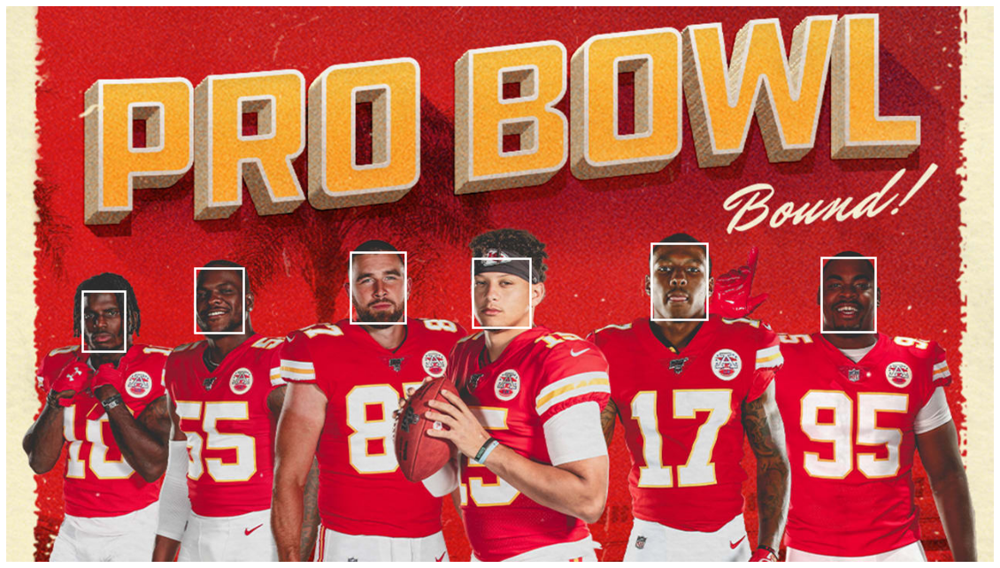

In [10]:
plot_bounding_box_image('./data/chiefs_probowl.jpg',job_response['FaceDetails'])

Woohoo!  We were able to indetify the six faces in the image.  Next, let's only plot the faces that Rekognition has identified that have a beard

In [11]:
def plot_bounding_box_image_beard(img_file, img_response):
        
        img=mpimg.imread(img_file)
        plt.figure(figsize=(20,20))
        plt.axis('off')
        plt.imshow(img)
        height = img.shape[0]
        width = img.shape[1]

        for p,det in enumerate(img_response):
            
            if det['Beard']['Value'] is True and det['Beard']['Confidence']>80.0:
                print('Beard Detected!  Confidence:  ','{:0.2f}%'.format(det['Beard']['Confidence']))
                bbox_w = det['BoundingBox']['Width']
                bbox_h = det['BoundingBox']['Height']
                bbox_t = det['BoundingBox']['Top']
                bbox_l = det['BoundingBox']['Left']

                rect = plt.Rectangle((int(bbox_l*width), int(bbox_t*height)), int(bbox_w*width),
                                     int(bbox_h*height), fill=False,
                                     edgecolor='white',
                                     linewidth=2.5)
                plt.gca().add_patch(rect)

        plt.show()

Beard Detected!  Confidence:   96.46%


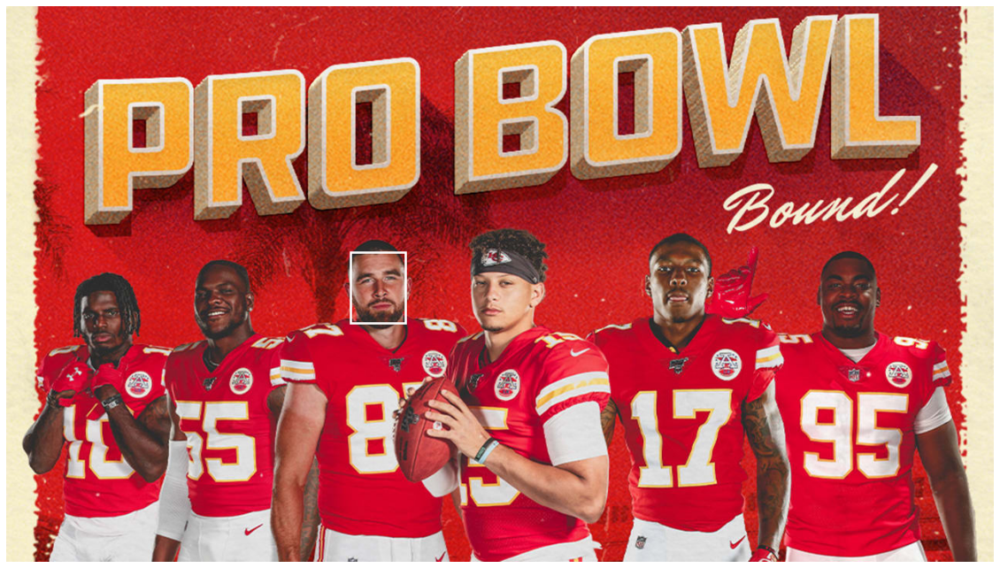

In [12]:
plot_bounding_box_image_beard('./data/chiefs_probowl.jpg',job_response['FaceDetails'])

## Compare Faces in Images

We showed above how to find faces in an image.  Next, let's use Rek for facial comparison.  Using compare_faces function.  This compares a face in a source image with faces in the target image.  The scope of this comparison is limited to the faces that are detected in the target image.  

Where in the world is Patrick Mahomes? In this team photo?

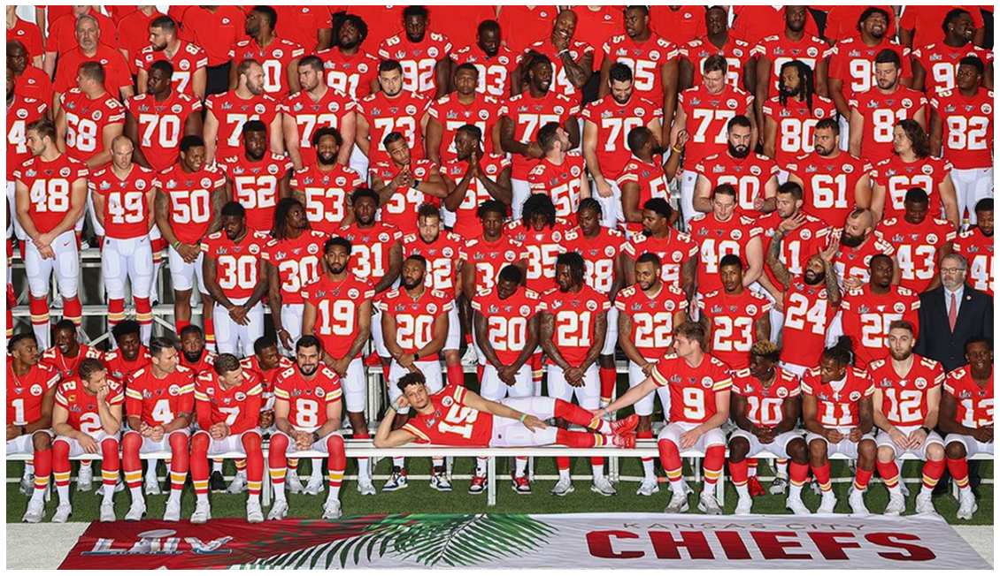

In [13]:
img_file = './data/chiefs1.png'
img=mpimg.imread(img_file)
plt.figure(figsize=(20,20))
plt.axis('off')
plt.imshow(img)

Let's use a picture of Patrick Mahomes from high school as the source face to indentify

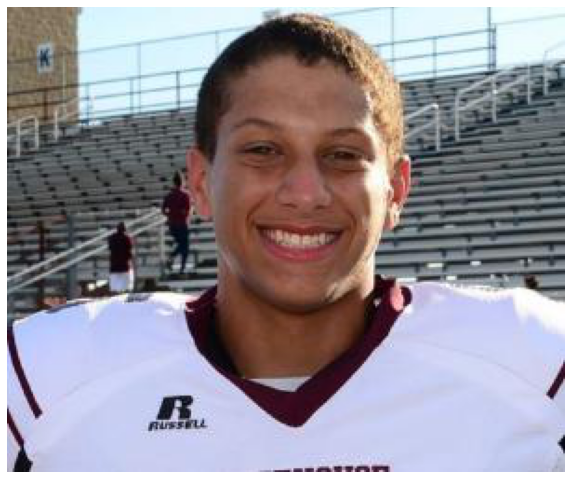

In [14]:
img_file = './data/mahomes2.jpg'
img=mpimg.imread(img_file)
plt.figure(figsize=(10,10))
plt.axis('off')
plt.imshow(img)

In [25]:
%%time

bucket = 'random.datasets.sengstacken'
name2 = 'faces_people/mahomes2.jpg'
name3 = 'faces_people/chiefs1.png'

job_response = client.compare_faces(
    SourceImage={
        'S3Object': {
            'Bucket': bucket,
            'Name': name2,
        }
    },
    TargetImage={
        'S3Object': {
            'Bucket': bucket,
            'Name': name3,
        }
    },
    SimilarityThreshold=40,
    QualityFilter='AUTO'
)

CPU times: user 9.67 ms, sys: 89 µs, total: 9.76 ms
Wall time: 3.71 s


In [28]:
if job_response['FaceMatches'] is not '[]':  print('Found A Match!!')

Found A Match!!


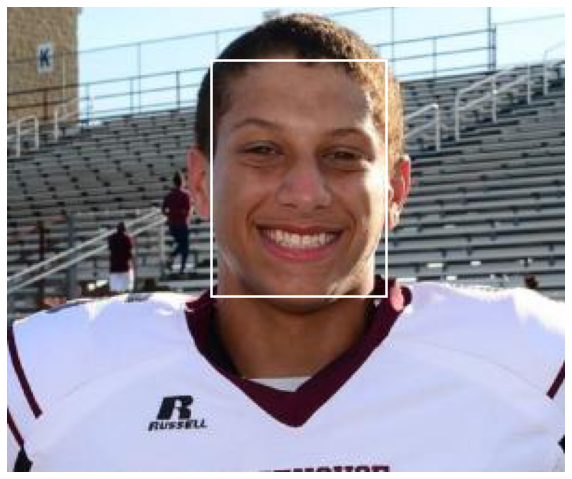

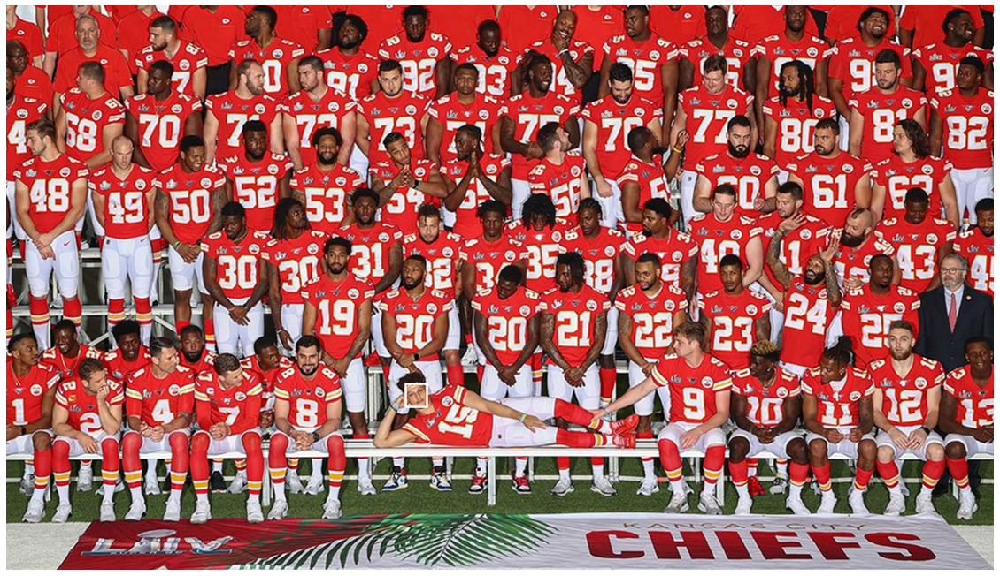

In [29]:
# plot source image
img=mpimg.imread('./data/mahomes2.jpg')
plt.figure(figsize=(10,10))
plt.axis('off')
plt.imshow(img)
height = img.shape[0]
width = img.shape[1]
bbox_w = job_response['SourceImageFace']['BoundingBox']['Width']
bbox_h = job_response['SourceImageFace']['BoundingBox']['Height']
bbox_t = job_response['SourceImageFace']['BoundingBox']['Top']
bbox_l = job_response['SourceImageFace']['BoundingBox']['Left']
rect = plt.Rectangle((int(bbox_l*width), int(bbox_t*height)), int(bbox_w*width),
                             int(bbox_h*height), fill=False,
                             edgecolor='white',
                             linewidth=2.5)
plt.gca().add_patch(rect)

# plot target image
img=mpimg.imread('./data/chiefs1.png')
plt.figure(figsize=(20,20))
plt.axis('off')
plt.imshow(img)
height = img.shape[0]
width = img.shape[1]
bbox_w = job_response['FaceMatches'][0]['Face']['BoundingBox']['Width']
bbox_h = job_response['FaceMatches'][0]['Face']['BoundingBox']['Height']
bbox_t = job_response['FaceMatches'][0]['Face']['BoundingBox']['Top']
bbox_l = job_response['FaceMatches'][0]['Face']['BoundingBox']['Left']
rect = plt.Rectangle((int(bbox_l*width), int(bbox_t*height)), int(bbox_w*width),
                             int(bbox_h*height), fill=False,
                             edgecolor='white',
                             linewidth=2.5)
plt.gca().add_patch(rect)

# Show both images
plt.show()

## Create Face Collections

Now, rather than comparing two images, let's create a face collection to use for a number of different images.  We will first detect faces in the input image and adds them to the specified collection.

Amazon Rekognition doesn't save the actual faces that are detected. Instead, the underlying detection algorithm first detects the faces in the input image. For each face, the algorithm extracts facial features into a feature vector, and stores it in the backend database. Amazon Rekognition uses feature vectors when it performs face match and search operations using the SearchFaces and SearchFacesByImage operations.

In [35]:
client=boto3.client('rekognition')

In [36]:
# List Collections
client.list_collections()

{'CollectionIds': [],
 'FaceModelVersions': [],
 'ResponseMetadata': {'RequestId': 'f05200b7-37b2-4b06-9672-1ca591554a12',
  'HTTPStatusCode': 200,
  'HTTPHeaders': {'content-type': 'application/x-amz-json-1.1',
   'date': 'Tue, 25 May 2021 18:50:45 GMT',
   'x-amzn-requestid': 'f05200b7-37b2-4b06-9672-1ca591554a12',
   'content-length': '43',
   'connection': 'keep-alive'},
  'RetryAttempts': 0}}

First, let's create a collection

In [38]:
# create a collection
collection_id='chiefs_team_collection' 

response = client.create_collection(
    CollectionId=collection_id
)

now we will index faces and add them to the collection

In [39]:
def index_faces(bucket,name,externalID,collection_id):
    response=client.index_faces(CollectionId=collection_id,                                 
                                Image={'S3Object':{'Bucket':bucket,'Name':name}},                                 
                                ExternalImageId=externalID,                                                                
                                QualityFilter="AUTO",                                 
                                DetectionAttributes=['ALL'])     

    print ('Results for ' + name)       
    print('Faces indexed:')           
    for faceRecord in response['FaceRecords']:          
        print('  Face ID: ' + faceRecord['Face']['FaceId'])          
        print('  Location: {}'.format(faceRecord['Face']['BoundingBox'])) 

    print('Faces not indexed:')     
    for unindexedFace in response['UnindexedFaces']:         
        print(' Location: {}'.format(unindexedFace['FaceDetail']['BoundingBox']))         
        print(' Reasons:')         
        for reason in unindexedFace['Reasons']:             
            print('   ' + reason)   

the first image we will index is the Chiefs team photo

In [40]:
bucket = 'random.datasets.sengstacken'
name = 'faces_people/chiefs1.png'
externalID = 'chiefs1.png'
index_faces(bucket,name,externalID,collection_id)

Results for faces_people/chiefs1.png
Faces indexed:
  Face ID: 095f82d4-0e79-41b7-b660-bd735695cce7
  Location: {'Width': 0.023182561621069908, 'Height': 0.053467292338609695, 'Left': 0.8932734131813049, 'Top': 0.5703501105308533}
  Face ID: 861328c0-bab5-4514-bc5c-a7566c70c0d3
  Location: {'Width': 0.02186560072004795, 'Height': 0.05210595577955246, 'Left': 0.9456834197044373, 'Top': 0.4455309808254242}
  Face ID: ed8c9f28-c146-43b3-bc2c-a15833903950
  Location: {'Width': 0.021626729518175125, 'Height': 0.05179480090737343, 'Left': 0.3241344392299652, 'Top': 0.42196184396743774}
  Face ID: f8135552-dd52-413a-b837-d7a9b6246aa2
  Location: {'Width': 0.022393835708498955, 'Height': 0.04995570331811905, 'Left': 0.7314236164093018, 'Top': 0.21222923696041107}
  Face ID: 15ef8156-d87a-4b60-a946-df6b699cdddc
  Location: {'Width': 0.021566029638051987, 'Height': 0.04992401599884033, 'Left': 0.4001106917858124, 'Top': 0.4473414123058319}
  Face ID: 4b167b55-72a4-4a9a-b333-534b6e33da57
  Locati

Now let's index the single Patrick Mahomes photo

In [41]:
bucket = 'random.datasets.sengstacken'
name = 'faces_people/mahomes2.jpg'
externalID = 'mahomes2.png'

index_faces(bucket,name,externalID,collection_id)

Results for faces_people/mahomes2.jpg
Faces indexed:
  Face ID: 0c5abf93-1fe1-4d81-873b-8a158c09969a
  Location: {'Width': 0.3149011731147766, 'Height': 0.5116413235664368, 'Left': 0.3662826120853424, 'Top': 0.11277712881565094}
Faces not indexed:


In [42]:
# Describe Collections
client.describe_collection(CollectionId='chiefs_team_collection')

{'FaceCount': 71,
 'FaceModelVersion': '5.0',
 'CollectionARN': 'arn:aws:rekognition:us-east-1:431615879134:collection/chiefs_team_collection',
 'CreationTimestamp': datetime.datetime(2021, 5, 25, 18, 52, 6, 357000, tzinfo=tzlocal()),
 'ResponseMetadata': {'RequestId': 'a5c04fcf-024a-49fb-a138-073ffd900ad0',
  'HTTPStatusCode': 200,
  'HTTPHeaders': {'content-type': 'application/x-amz-json-1.1',
   'date': 'Tue, 25 May 2021 18:55:06 GMT',
   'x-amzn-requestid': 'a5c04fcf-024a-49fb-a138-073ffd900ad0',
   'content-length': '173',
   'connection': 'keep-alive'},
  'RetryAttempts': 0}}

In [28]:
# Delete Collections
# client.delete_collection(CollectionId='chiefs_team_collection')

{'StatusCode': 200,
 'ResponseMetadata': {'RequestId': '3fdef862-def0-4570-9d5a-0cf7d20592c0',
  'HTTPStatusCode': 200,
  'HTTPHeaders': {'content-type': 'application/x-amz-json-1.1',
   'date': 'Fri, 08 May 2020 19:01:16 GMT',
   'x-amzn-requestid': '3fdef862-def0-4570-9d5a-0cf7d20592c0',
   'content-length': '18',
   'connection': 'keep-alive'},
  'RetryAttempts': 0}}

In [43]:
# List Collections
client.list_collections()

{'CollectionIds': ['chiefs_team_collection'],
 'FaceModelVersions': ['5.0'],
 'ResponseMetadata': {'RequestId': 'a82ddbd1-1e19-4cd1-8e4d-84674145ad28',
  'HTTPStatusCode': 200,
  'HTTPHeaders': {'content-type': 'application/x-amz-json-1.1',
   'date': 'Tue, 25 May 2021 18:55:19 GMT',
   'x-amzn-requestid': 'a82ddbd1-1e19-4cd1-8e4d-84674145ad28',
   'content-length': '72',
   'connection': 'keep-alive'},
  'RetryAttempts': 0}}

In [44]:
# List Faces in a Collection
client.list_faces(CollectionId='chiefs_team_collection',MaxResults=100) 

{'Faces': [{'FaceId': '04d66b37-a9cd-4dca-acf4-671451bc96c6',
   'BoundingBox': {'Width': 0.01897449977695942,
    'Height': 0.04272269830107689,
    'Left': 0.08313369750976562,
    'Top': 0.6446639895439148},
   'ImageId': '228138ab-90c4-3dfe-952b-13d2f8fba73a',
   'ExternalImageId': 'chiefs1.png',
   'Confidence': 99.95399475097656},
  {'FaceId': '070101ca-aebc-4288-8f47-dabcea3281c4',
   'BoundingBox': {'Width': 0.019862700253725052,
    'Height': 0.0412105992436409,
    'Left': 0.9111149907112122,
    'Top': 0.3437870144844055},
   'ImageId': '228138ab-90c4-3dfe-952b-13d2f8fba73a',
   'ExternalImageId': 'chiefs1.png',
   'Confidence': 99.90249633789062},
  {'FaceId': '095f82d4-0e79-41b7-b660-bd735695cce7',
   'BoundingBox': {'Width': 0.023182600736618042,
    'Height': 0.05346729978919029,
    'Left': 0.8932729959487915,
    'Top': 0.5703499913215637},
   'ImageId': '228138ab-90c4-3dfe-952b-13d2f8fba73a',
   'ExternalImageId': 'chiefs1.png',
   'Confidence': 99.98450469970703},
  

Using the index and the FaceIds, let's search the face collection for a specific ID

In [45]:
# search a collection for a face ID
response = client.search_faces(CollectionId='chiefs_team_collection',                                 
                             FaceId='0c5abf93-1fe1-4d81-873b-8a158c09969a',                                 
                             FaceMatchThreshold=40,                                 
                             MaxFaces=3) 

In [46]:
response

{'SearchedFaceId': '0c5abf93-1fe1-4d81-873b-8a158c09969a',
 'FaceMatches': [{'Similarity': 41.46282958984375,
   'Face': {'FaceId': 'a9855fc4-d9bd-4d97-8fdd-de3916681fa2',
    'BoundingBox': {'Width': 0.02272219955921173,
     'Height': 0.042305801063776016,
     'Left': 0.40394100546836853,
     'Top': 0.6689509749412537},
    'ImageId': '228138ab-90c4-3dfe-952b-13d2f8fba73a',
    'ExternalImageId': 'chiefs1.png',
    'Confidence': 99.972900390625}}],
 'FaceModelVersion': '5.0',
 'ResponseMetadata': {'RequestId': '1d26bc2d-9113-4e3d-b8ee-2c922c265644',
  'HTTPStatusCode': 200,
  'HTTPHeaders': {'content-type': 'application/x-amz-json-1.1',
   'date': 'Tue, 25 May 2021 18:56:36 GMT',
   'x-amzn-requestid': '1d26bc2d-9113-4e3d-b8ee-2c922c265644',
   'content-length': '424',
   'connection': 'keep-alive'},
  'RetryAttempts': 0}}

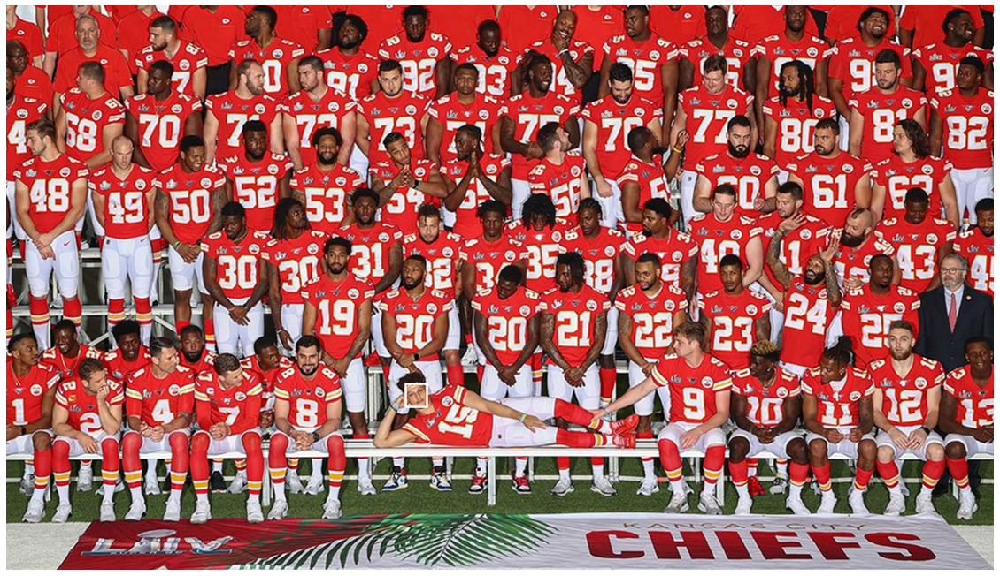

In [48]:
# plot target image
img=mpimg.imread('./data/chiefs1.png')
plt.figure(figsize=(20,20))
plt.axis('off')
plt.imshow(img)
height = img.shape[0]
width = img.shape[1]
bbox_w = response['FaceMatches'][0]['Face']['BoundingBox']['Width']
bbox_h = response['FaceMatches'][0]['Face']['BoundingBox']['Height']
bbox_t = response['FaceMatches'][0]['Face']['BoundingBox']['Top']
bbox_l = response['FaceMatches'][0]['Face']['BoundingBox']['Left']
rect = plt.Rectangle((int(bbox_l*width), int(bbox_t*height)), int(bbox_w*width),
                             int(bbox_h*height), fill=False,
                             edgecolor='white',
                             linewidth=2.5)
plt.gca().add_patch(rect)

# Show both images
plt.show()

Let's add another team photo to the face collection

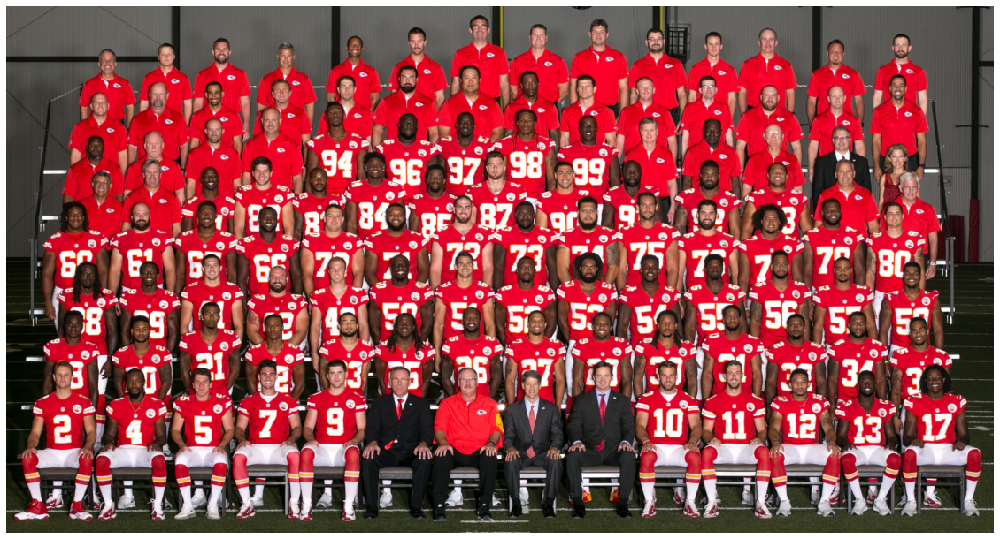

In [50]:
img_file = './data/chiefs2.jpeg'
img=mpimg.imread(img_file)
plt.figure(figsize=(20,20))
plt.axis('off')
plt.imshow(img)

In [51]:
bucket = 'random.datasets.sengstacken'
name = 'faces_people/chiefs2.jpeg'
externalID = 'chiefs2.jpeg'

index_faces(bucket,name,externalID,collection_id)

Results for faces_people/chiefs2.jpeg
Faces indexed:
  Face ID: 054875b3-3590-4cf6-bc20-ae62d5241dd8
  Location: {'Width': 0.01741650328040123, 'Height': 0.047873690724372864, 'Left': 0.4582030773162842, 'Top': 0.6903460025787354}
  Face ID: bc959e92-b325-49fc-a4ab-baf46db99309
  Location: {'Width': 0.017332080751657486, 'Height': 0.04732176661491394, 'Left': 0.3898078501224518, 'Top': 0.6883923411369324}
  Face ID: 87a58bb0-0163-4d72-940f-0142ba3b244b
  Location: {'Width': 0.017719091847538948, 'Height': 0.043245717883110046, 'Left': 0.5802077054977417, 'Top': 0.3707031309604645}
  Face ID: e8e937ec-0e64-46ff-9591-34bed1311df1
  Location: {'Width': 0.017286084592342377, 'Height': 0.04419484734535217, 'Left': 0.38980400562286377, 'Top': 0.47411760687828064}
  Face ID: 16cebebd-0353-4c87-a8be-7174cbd91f75
  Location: {'Width': 0.01718134805560112, 'Height': 0.04438869655132294, 'Left': 0.9149231314659119, 'Top': 0.5970970392227173}
  Face ID: 9cc4f16b-3df1-4ae0-9b59-ef98ed5ae658
  Locat

Now we will look for the coach - Andy Reid.  Let's add an image of him from his days with the Eagles

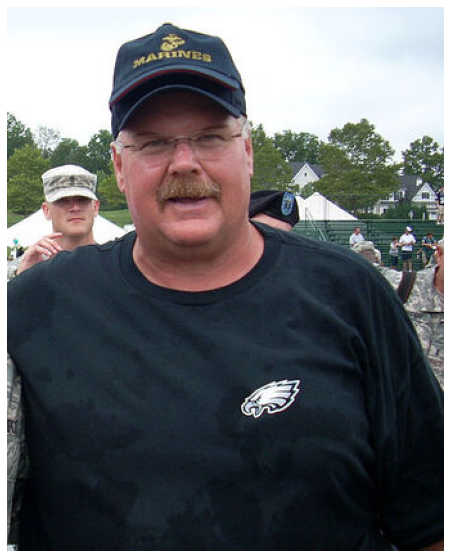

In [52]:
img_file = './data/reid2.jpg'
img=mpimg.imread(img_file)
plt.figure(figsize=(10,10))
plt.axis('off')
plt.imshow(img)

In [53]:
bucket = 'random.datasets.sengstacken'
name = 'faces_people/reid2.jpg'
externalID = 'reid2.jpg'

index_faces(bucket,name,externalID,collection_id)

Results for faces_people/reid2.jpg
Faces indexed:
  Face ID: 899ea2ed-7718-43a3-822d-1de9e2dda2b8
  Location: {'Width': 0.2795131206512451, 'Height': 0.2913445830345154, 'Left': 0.2676737904548645, 'Top': 0.1420661211013794}
  Face ID: 62eb6159-5c99-4546-b133-a8e56e705a4d
  Location: {'Width': 0.09871456027030945, 'Height': 0.09337325394153595, 'Left': 0.09797830134630203, 'Top': 0.3266671299934387}
Faces not indexed:


Note that it picked up two faces in the coach's image.  Let's look for the largest image and search the index

In [54]:
# search a collection for a face ID
job_response = client.search_faces(CollectionId='chiefs_team_collection',                                 
                             FaceId='899ea2ed-7718-43a3-822d-1de9e2dda2b8',                                 
                             FaceMatchThreshold=80,                                 
                             MaxFaces=4) 

job_response

{'SearchedFaceId': '899ea2ed-7718-43a3-822d-1de9e2dda2b8',
 'FaceMatches': [{'Similarity': 99.97883605957031,
   'Face': {'FaceId': '054875b3-3590-4cf6-bc20-ae62d5241dd8',
    'BoundingBox': {'Width': 0.01741649955511093,
     'Height': 0.04787369817495346,
     'Left': 0.458202987909317,
     'Top': 0.6903460025787354},
    'ImageId': 'c69adbb4-10cd-3dcb-adce-a9c7305f307c',
    'ExternalImageId': 'chiefs2.jpeg',
    'Confidence': 99.99979400634766}}],
 'FaceModelVersion': '5.0',
 'ResponseMetadata': {'RequestId': '1cc7b8f4-746a-4168-b241-e5b1ae401f57',
  'HTTPStatusCode': 200,
  'HTTPHeaders': {'content-type': 'application/x-amz-json-1.1',
   'date': 'Tue, 25 May 2021 19:02:35 GMT',
   'x-amzn-requestid': '1cc7b8f4-746a-4168-b241-e5b1ae401f57',
   'content-length': '424',
   'connection': 'keep-alive'},
  'RetryAttempts': 0}}

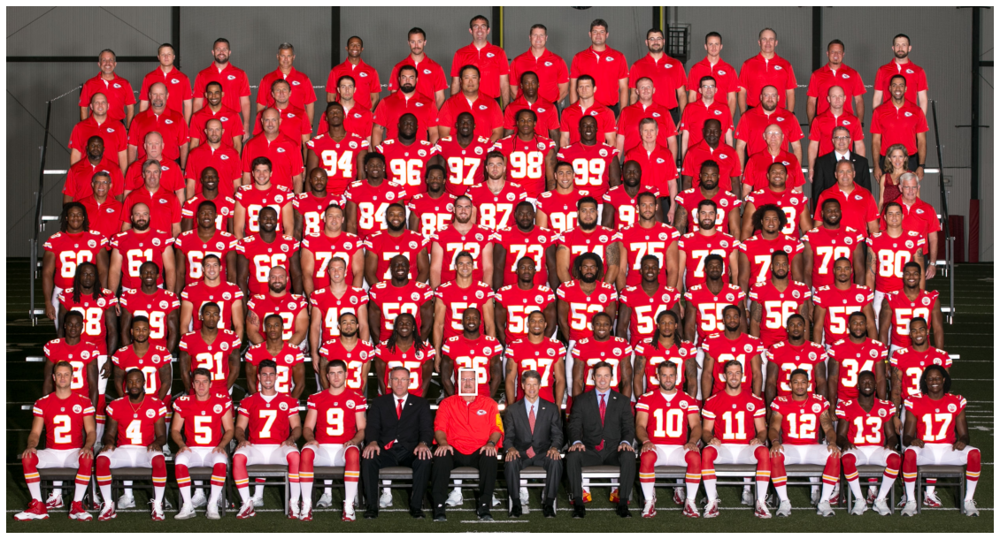

In [55]:
img=mpimg.imread('./data/chiefs2.jpeg')
plt.figure(figsize=(20,20))
plt.axis('off')
plt.imshow(img)
height = img.shape[0]
width = img.shape[1]
bbox_w = job_response['FaceMatches'][0]['Face']['BoundingBox']['Width']
bbox_h = job_response['FaceMatches'][0]['Face']['BoundingBox']['Height']
bbox_t = job_response['FaceMatches'][0]['Face']['BoundingBox']['Top']
bbox_l = job_response['FaceMatches'][0]['Face']['BoundingBox']['Left']
rect = plt.Rectangle((int(bbox_l*width), int(bbox_t*height)), int(bbox_w*width),
                             int(bbox_h*height), fill=False,
                             edgecolor='white',
                             linewidth=2.5)
plt.gca().add_patch(rect)

# Show both images
plt.show()

# Video Analysis

Let's find all of the faces in a video. Amazon Rekognition Video processes a video that's stored in an Amazon S3 bucket. The design pattern is an asynchronous set of operations. https://docs.aws.amazon.com/rekognition/latest/dg/rekognition-dg.pdf 

Amazon Rekognition operations can analyze videos that are stored in Amazon S3 buckets. The video must be encoded using the H.264 codec. The supported file formats are MPEG-4 and MOV.  A codec is software or hardware that compresses data for faster delivery and decompresses received datainto its original form. The H.264 codec is commonly used for recording, compressing, and distributingvideo content. A video file format can contain one or more codecs. If your MOV or MPEG-4 format videofile doesn't work with Amazon Rekognition Video, check that the codec used to encode the video isH.264.The maximum file size for a stored video is 10GB.

In [62]:
from IPython.display import Video
Video('./data/face_video.mov')

## Face Detection

In [57]:
# start the job
client=boto3.client('rekognition')
bucket = 'random.datasets.sengstacken'
name = 'faces_people/face_video.mov'#'faces_people/grocery_store.mp4'
jobresponse = client.start_face_detection(
    Video={
        'S3Object': {
            'Bucket': bucket,
            'Name': name,
        }
    },
    FaceAttributes='ALL',
)

In [58]:
jobresponse

{'JobId': 'ca6a42da9f0c92822d9ca7d9fad44b132553c78de9788e70e3a49cdc4742ca23',
 'ResponseMetadata': {'RequestId': '12df4f11-8345-48c2-bed1-574f848f4fd4',
  'HTTPStatusCode': 200,
  'HTTPHeaders': {'content-type': 'application/x-amz-json-1.1',
   'date': 'Tue, 25 May 2021 19:03:59 GMT',
   'x-amzn-requestid': '12df4f11-8345-48c2-bed1-574f848f4fd4',
   'content-length': '76',
   'connection': 'keep-alive'},
  'RetryAttempts': 0}}

Now let's parse the results to find faces within the video

In [59]:
maxResults = 50
paginationToken = ''
finished = False
JobID = jobresponse['JobId']

while finished == False:
    response = client.get_face_detection(JobId=JobID,
                                    MaxResults=maxResults,
                                    NextToken=paginationToken)

    if response['JobStatus'] != 'SUCCEEDED':
        print('job not yet complete, please try again later')
        finished = True
    else:
        print('Codec: ' + response['VideoMetadata']['Codec'])
        print('Duration: ' + str(response['VideoMetadata']['DurationMillis']))
        print('Format: ' + response['VideoMetadata']['Format'])
        print('Frame rate: ' + str(response['VideoMetadata']['FrameRate']))
        print()

        for faceDetection in response['Faces']:
            #print('Face: ' + str(faceDetection['Face']))
            print('Face Detected:  Confidence: ' + '{:0.2f}%'.format(faceDetection['Face']['Confidence']) + '  Timestamp: ' + str(faceDetection['Timestamp']))

        if 'NextToken' in response:
            paginationToken = response['NextToken']
        else:
            finished = True

Codec: h264
Duration: 19143
Format: QuickTime / MOV
Frame rate: 30.089590072631836

Face Detected:  Confidence: 99.99%  Timestamp: 0
Face Detected:  Confidence: 100.00%  Timestamp: 498
Face Detected:  Confidence: 100.00%  Timestamp: 997
Face Detected:  Confidence: 100.00%  Timestamp: 1495
Face Detected:  Confidence: 100.00%  Timestamp: 1994
Face Detected:  Confidence: 99.99%  Timestamp: 2492
Face Detected:  Confidence: 99.99%  Timestamp: 2991
Face Detected:  Confidence: 100.00%  Timestamp: 3489
Face Detected:  Confidence: 100.00%  Timestamp: 3988
Face Detected:  Confidence: 100.00%  Timestamp: 4486
Face Detected:  Confidence: 99.99%  Timestamp: 4985
Face Detected:  Confidence: 99.99%  Timestamp: 5483
Face Detected:  Confidence: 99.99%  Timestamp: 5982
Face Detected:  Confidence: 100.00%  Timestamp: 6480
Face Detected:  Confidence: 99.99%  Timestamp: 6979
Face Detected:  Confidence: 100.00%  Timestamp: 7477
Face Detected:  Confidence: 100.00%  Timestamp: 7976
Face Detected:  Confidence:

We can even get an estimated age for the faces detected.  Here, let's see how my age prediction changed as I removed my hat in the video.  As we plot the predicted age, I get older as I remove my hat!

In [63]:
t, l, h = [], [], []
for face in response['Faces']:
    #print(face)
    t.append(face['Timestamp']/1000)
    l.append(face['Face']['AgeRange']['Low'])
    h.append(face['Face']['AgeRange']['High'])

Text(0, 0.5, 'Age, years')

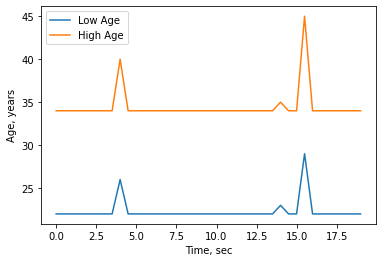

In [64]:
fig, ax = plt.subplots()

#ax.set_title('Age Estimate During Video')
plt.plot(t,l)
plt.plot(t,h)
plt.legend(['Low Age','High Age'])
plt.xlabel('Time, sec')
plt.ylabel('Age, years')

## Get Images from Video

We can also extract the faces that were detected in each frame of the video.  Here we will extract the faces from the frames and plot them

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


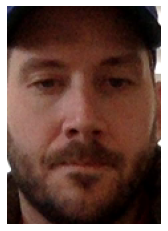

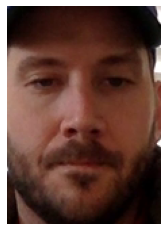

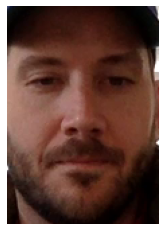

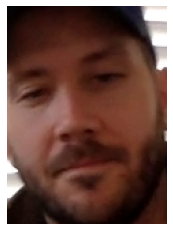

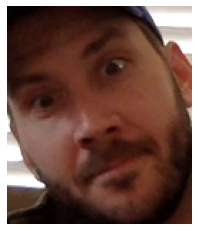

...

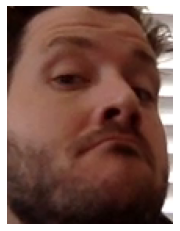

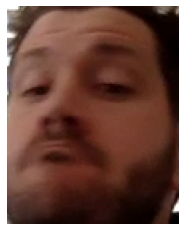

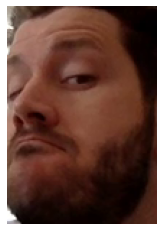

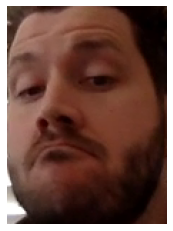

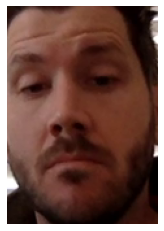

In [66]:
import numpy
import cv2

cap = cv2.VideoCapture('./data/face_video.mov')
fps = cap.get(cv2.CAP_PROP_FPS)      # OpenCV2 version 2 used "CV_CAP_PROP_FPS"
frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))


height = response['VideoMetadata']['FrameHeight']
width = response['VideoMetadata']['FrameWidth']

# loop over frames
for n in range(frame_count):

    # read the frames
    _,frame = cap.read()

    # calc time in video
    t = n*(1000.0/fps)
    
    for a in response['Faces']:
        
        if a['Timestamp'] < t+5 and a['Timestamp'] > t-5:
            ##print(a['Timestamp'])

            bbox_w = int(a['Face']['BoundingBox']['Width']*width)
            bbox_h = int(a['Face']['BoundingBox']['Height']*height)
            bbox_t = int(a['Face']['BoundingBox']['Top']*height)
            bbox_l = int(a['Face']['BoundingBox']['Left']*width)
            
            cropped = frame[bbox_t:(bbox_t+bbox_h), bbox_l:(bbox_l+bbox_w)]
            cropped = cropped[:,:,::-1]
            plt.figure()
            plt.axis('off')
            plt.imshow(cropped)
    

